### Parse `Tabletop Objects`

In [1]:
import sys
import json
import random
import numpy as np
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
sys.path.append('../../package/mujoco_helper/') # for 'mujoco_parser'
sys.path.append('../../package/kinematics_helper/') # for 'transforms'
sys.path.append('../../package/utility/') # for 'utils'
from mujoco_parser import *
from transforms import *
from utils import *
from ik import *
np.set_printoptions(precision=2,suppress=True,linewidth=100)
plt.rc('xtick',labelsize=6); plt.rc('ytick',labelsize=6)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
print ("MuJoCo version:",MUJOCO_VERSION)

MuJoCo version: (3, 1, 6)


In [2]:
# Get (Google's) scanned object names
folder_path = './converted_models'
scanned_object_names = [f.name for f in os.scandir(folder_path) if f.is_dir()]
print ("scanned_object_names:[%d]"%(len(scanned_object_names)))

# Sample object names
# n_loaded_object = 10
# loaded_objects = random.sample(scanned_object_names,n_loaded_object) # sample
# print ("n_loaded_object:[%d]"%(n_loaded_object))
# print ("loaded_objects:%s"%(loaded_objects))

loaded_object = ['Reebok_CLASSIC_JOGGER']
print("loaded_object:%s"%(loaded_object))

# Append sampled object names to xml
xml_path = './scene_table.xml'
tree = ET.parse(xml_path)
root = tree.getroot()
for obj_name in loaded_object:
    file_path = '%s/%s/model.xml'%(folder_path,obj_name)
    include_tag = ET.Element('include',attrib={'file':file_path})
    root.append(include_tag)
xml_string = prettify(root) # indent xml

# Print xml string
print ("\n\n",xml_string,"\n\n")

# Parse 'xml_string'
env = MuJoCoParserClass(name='Tabletop',xml_string=xml_string,verbose=True)

scanned_object_names:[1030]
loaded_object:['Reebok_CLASSIC_JOGGER']


 <?xml version="1.0" ?>
<mujoco model="Scanned Objects">
    <size memory="500M"/>
    <compiler angle="radian" autolimits="true"/>
    <option integrator="RK4" noslip_iterations="20"/>
    <default>
        <joint armature="0.1" damping="0.1"/>
        <default class="visual_only">
            <geom type="mesh" contype="0" conaffinity="0" group="2"/>
        </default>
        <default class="no_visual_collision">
            <geom type="capsule" solimp=".9 .99 .001" solref=".015 1" group="3"/>
        </default>
        <default class="visual_collision">
            <geom type="mesh" solimp=".9 .99 .001" solref=".015 1" group="2"/>
        </default>
    </default>
    <include file="../../asset/tabletop/object/floor_isaac_style.xml"/>
    <include file="../../asset/tabletop/object/object_table.xml"/>
    <include file="./converted_models/Reebok_CLASSIC_JOGGER/model.xml"/>
</mujoco> 


name:[Tabletop] dt:[0.002] HZ

### Camera Span + Capture Point Cloud

In [3]:
env.reset()
env.init_viewer(
    black_sky   = True,
    transparent = False,
    geomgroup_0     = 1, # floor sky
    geomgroup_1     = 1, # collision
    geomgroup_2     = 1, # visual (this slows down)
)
obj_name = env.get_body_names(prefix='body_obj_')
obj_xyzs = sample_xyzs(
    n_sample=len(obj_name),
    x_range=[-0.4,+1.4],y_range=[-0.5,+0.5],z_range=[0.9,0.9],
    min_dist=0.25, # 0.25
)
for obj_idx,obj_body_name in enumerate(obj_name):
    env.set_p_base_body(body_name=obj_body_name,p=obj_xyzs[obj_idx,:])
    R_rand = rpy2r(np.deg2rad([0,0,360*np.random.rand()]))
    env.set_R_base_body(body_name=obj_body_name,R=R_rand)
env.forward(increase_tick=False)
while env.is_viewer_alive():
    env.step()
    if env.loop_every(tick_every=10):
        env.plot_T()
        env.plot_time()
        # env.plot_contact_info(rate=1.0)
        # env.plot_bodies_T(body_names=obj_body_names,plot_axis=False,axis_len=0.1,axis_width=0.005,plot_name=True)
        env.render()
print ("Done.")

Done.


In [4]:
env.reset()
env.init_viewer(
    azimuth           = 163.88,
    distance          = 4.5,
    elevation         = -10,
    lookat            = [0.01,0.11,0.5],
    transparent       = False,
    black_sky         = True,
    use_rgb_overlay   = True,
    loc_rgb_overlay   = 'top right',
    use_rgb_overlay_2 = False,
    loc_rgb_overlay_2 = 'bottom right',
)

p_center = np.array([0.6, 0, 1.2])
radius = 0.5
pcd_array = np.empty((0,3))

R_start = rpy2r(np.radians([0,-45,0]))
obj_name = env.get_body_names(prefix='body_obj_')

for obj_idx,obj_body_name in enumerate(obj_name):
    env.set_p_base_body(body_name=obj_body_name,p=np.array([0.6,0,0.8]))
    env.set_R_base_body(body_name=obj_body_name,R=np.eye(3,3))
env.forward(increase_tick=False)

while env.is_viewer_alive() and env.tick < 2*np.pi*100:
    env.step()

    theta = env.tick / 100
    p_curr = p_center - radius* np.array((np.cos(theta),np.sin(theta),0))
    R_spin = rpy2r([0,0,theta])
    R_curr = np.dot(R_spin,R_start)
    env.data.cam('external').xpos = p_curr
    env.data.cam('external').xmat = np.reshape(R_curr,(9,))

    if env.loop_every(tick_every=10):
        rgb_ext,depth_ext,pcd_ext,T_cam_ext = env.get_fixed_cam_rgbd_pcd(
            cam_name='external',downscale_pcd=0.1)
        pcd_ext_above = pcd_ext[pcd_ext[:,2] > 0.8]
        pcd_array = np.vstack((pcd_array,pcd_ext_above))
        
    if env.loop_every(tick_every=10):
        env.plot_T(T=T_cam_ext,axis_len=0.1,axis_width=0.005,label='External')
        env.viewer.add_rgb_overlay(rgb_img_raw=rgb_ext)
        for p in pcd_ext_above: env.plot_sphere(p=p,r=0.002,rgba=[0.05,0.95,0.05,1])
        env.render()

env.close_viewer()

In [5]:
env.reset()
env.init_viewer(
    azimuth           = 163.88,
    distance          = 4.5,
    elevation         = -10,
    lookat            = [0.01,0.11,0.5],
    transparent       = False,
    black_sky         = True,
)

for obj_idx,obj_body_name in enumerate(obj_name):
    env.set_p_base_body(body_name=obj_body_name,p=np.array([0.6,0,0.8]))
    env.set_R_base_body(body_name=obj_body_name,R=np.eye(3,3))
env.forward(increase_tick=False)

while env.is_viewer_alive():
    env.step()

    env.plot_T(T=T_cam_ext,axis_len=0.1,axis_width=0.005,label='External')
    for p in pcd_array[::10]: env.plot_sphere(p=p,r=0.002,rgba=[0.05,0.95,0.05,1])
    env.render()

env.close_viewer()

### ICP Algorithm

""

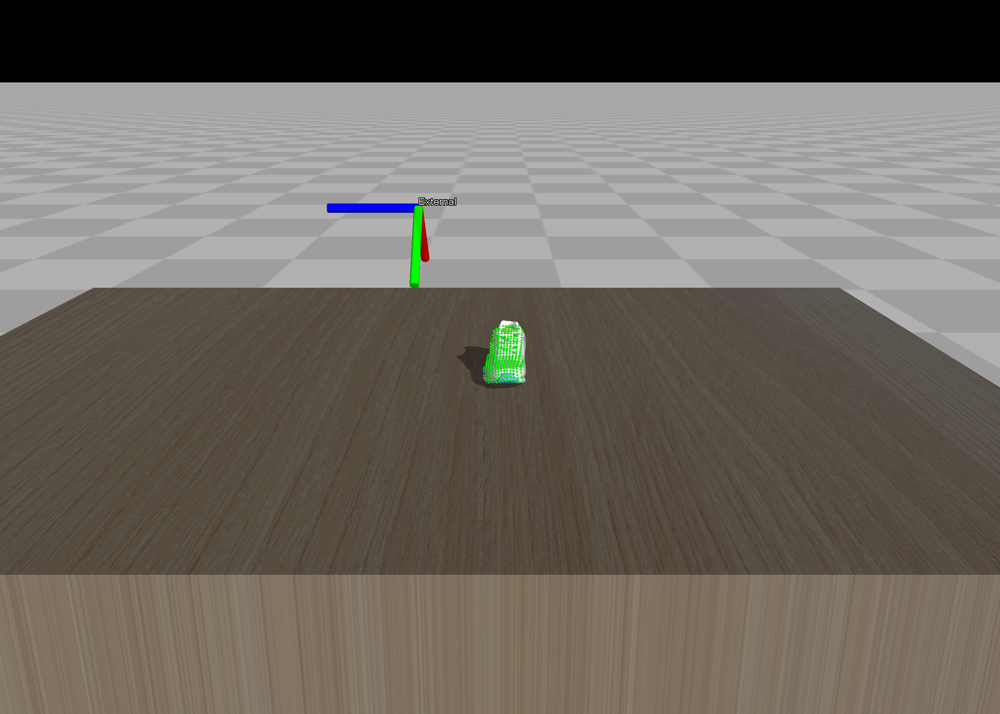

In [6]:
env.reset()
env.init_viewer(
    azimuth           = 90,
    distance          = 1.74,
    elevation         = -18,
    lookat            = [0.59, 0.1, 0.8],
    transparent       = False,
    black_sky         = True,
)

pcd_array1 = np.empty((0,3))

env.set_p_base_body(body_name=obj_body_name,p=np.array([0.6,0,0.8]))
env.set_R_base_body(body_name=obj_body_name,R=np.eye(3,3))
env.forward(increase_tick=False)

while env.is_viewer_alive() and env.tick < 100:
    env.step()

    theta = np.radians(90)
    p_curr = p_center - radius* np.array((np.cos(theta),np.sin(theta),0)) - [0.1,0.1,0]
    R_spin = rpy2r([0,0,theta])
    R_curr = np.dot(R_spin,R_start)
    env.data.cam('external').xpos = p_curr
    env.data.cam('external').xmat = np.reshape(R_curr,(9,))

    if env.loop_every(tick_every=10):
        rgb_ext,depth_ext,pcd_ext,T_cam_ext = env.get_fixed_cam_rgbd_pcd(
            cam_name='external',downscale_pcd=0.1)
        pcd_ext_above = pcd_ext[pcd_ext[:,2] > 0.8]
        pcd_array1 = np.vstack((pcd_array1,pcd_ext_above))
        

    for p in pcd_array1: env.plot_sphere(p=p,r=0.002,rgba=[0.05,0.95,0.05,1])
    env.plot_T(T=T_cam_ext,axis_len=0.1,axis_width=0.005,label='External')
    env.render()

    image1_backup, _ = env.grab_rgbd_img()
    if image1_backup.sum() > 0: image1 = image1_backup.copy()

env.close_viewer()

import mediapy
mediapy.show_image(image1, width = 1400)

""

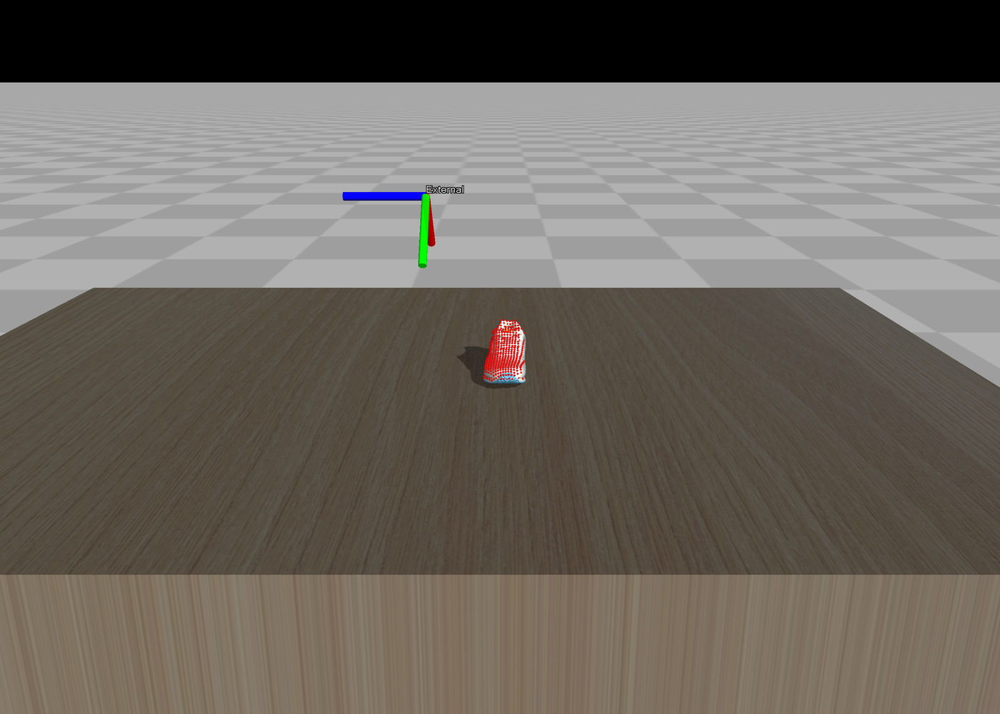

In [7]:
env.reset()
env.init_viewer(
    azimuth           = 90,
    distance          = 1.74,
    elevation         = -18,
    lookat            = [0.59, 0.1, 0.8],
    transparent       = False,
    black_sky         = True,
)

pcd_array2 = np.empty((0,3))

env.set_p_base_body(body_name=obj_body_name,p=np.array([0.6,0,0.8]))
env.set_R_base_body(body_name=obj_body_name,R=np.eye(3,3))
env.forward(increase_tick=False)

while env.is_viewer_alive() and env.tick < 100:
    env.step()

    theta = np.radians(90)
    p_curr = p_center - radius* np.array((np.cos(theta),np.sin(theta),0)) + [-0.1,0.0,0]
    R_spin = rpy2r([0,0,theta])
    R_curr = np.dot(R_spin,R_start)
    env.data.cam('external').xpos = p_curr
    env.data.cam('external').xmat = np.reshape(R_curr,(9,))

    if env.loop_every(tick_every=10):
        rgb_ext,depth_ext,pcd_ext,T_cam_ext = env.get_fixed_cam_rgbd_pcd(
            cam_name='external',downscale_pcd=0.1)
        pcd_ext_above = pcd_ext[pcd_ext[:,2] > 0.8]
        pcd_array2 = np.vstack((pcd_array2,pcd_ext_above))
        

    for p in pcd_array2: env.plot_sphere(p=p,r=0.002,rgba=[0.95,0.05,0.05,1])
    env.plot_T(T=T_cam_ext,axis_len=0.1,axis_width=0.005,label='External')
    env.render()

    image2_backup, _ = env.grab_rgbd_img()
    if image2_backup.sum() > 0: image2 = image2_backup.copy()

env.close_viewer()

import mediapy
mediapy.show_image(image2, width = 1400)

In [8]:
source = pcd_array2
target = pcd_array1

In [9]:
from sklearn.neighbors import NearestNeighbors

def nearest_neighbor(sorce, target, n_neighbors=1):
    neigh = NearestNeighbors(n_neighbors=n_neighbors)
    neigh.fit(target)
    distances, indices = neigh.kneighbors(sorce, return_distance=True)
    return distances.ravel(), indices.ravel()

def pcd_transform(point_cloud,Tm):
    np_point_cloud = point_cloud.reshape((-1,3))
    num = np_point_cloud.shape[0]
    np_point_cloud = np.concatenate([ np_point_cloud,np.ones((num,1)) ],axis=-1)
    t_pcd = np.dot(Tm,np_point_cloud.T).T
    return t_pcd[:,:3]

def find_approximation_transform(sorce, target):
    
    A = target.reshape((-1,3))
    B = sorce.reshape((-1,3))

    # 평균점 구하기
    cp_A = np.mean(A,axis=0).reshape((1,3))
    cp_B = np.mean(B,axis=0).reshape((1,3))

    # centroid화   
    X = A-cp_A
    Y = B-cp_B
    
    # 공분산행렬 계산
    D = np.dot(Y.T,X)

    # 특이값분해
    U,S,V_T = np.linalg.svd(D)
    
    # 근사행렬 == 회전행렬 계산
    R = np.dot(V_T,U)

    # 평균점과 구한 회전행렬을 이용하여 이동벡터 계산
    t =  cp_A.T - np.dot(R,cp_B.T)
    
    # 4x4 Transform matrix로 반환
    Tm = np.eye(4)
    Tm[:3,:3] = R[:3,:3]
    Tm[:3,3] = t.T

    return Tm

def ICP(source, target, iteration = 10, threshold = 1e-7):
    # 초기 자세(Pose) 정의 
    Tm = np.eye(4)
    # 초기 오차
    Error = 0

    # 최종 변환 자세
    final_Tm = Tm.copy()

    # 만약 초기 자세를 알면 아래 코드를 활성화
    local_source = pcd_transform(source,Tm)

    # 반복적(Iterative) 계산
    for _ in range(iteration):
        # 가까운 매칭점 계산
        distances, indices=nearest_neighbor(local_source,target)
        
        # 포인트간 평균 거리 계산
        Error = distances.mean()
        
        # 포인트 평균 거리가 한계값보다 작다면 더 이상 찾지 않고 반환
        if(Error<threshold):
            break

        # 매칭점과 두 포인트클라우드를 이용하여 근사 변환행렬 계산
        Tm = find_approximation_transform(local_source,target[indices])

        
        # source 포인트클라우드 변환행렬(Tm)을 이용하여 변환
        local_source = pcd_transform(local_source, Tm)

        # 근사된 변환행렬 반복적으로 누적하여 정합된 변환 추정
        final_Tm = np.matmul(Tm,final_Tm)

    return Error,final_Tm

""

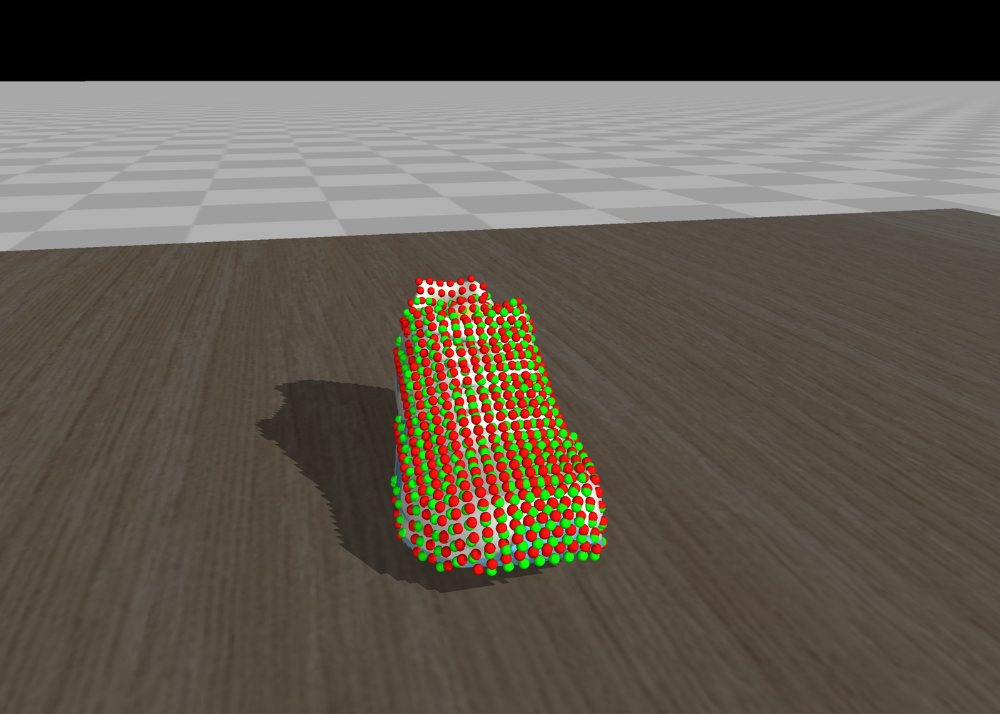

In [10]:
distances,indices=nearest_neighbor(source,target)
Tm = find_approximation_transform(source,target[indices])
source = pcd_transform(source,Tm)

env.reset()
env.init_viewer(
    azimuth           = 75,
    distance          = 0.5,
    elevation         = -18,
    lookat            = [0.64, 0.1, 0.83],
    transparent       = False,
    black_sky         = True,
)

env.set_p_base_body(body_name=obj_body_name,p=np.array([0.6,0,0.8]))
env.set_R_base_body(body_name=obj_body_name,R=np.eye(3,3))
env.forward(increase_tick=False)

while env.is_viewer_alive():
    env.step()

    for p in target: env.plot_sphere(p=p,r=0.002,rgba=[0.05,0.95,0.05,1])
    for p in source: env.plot_sphere(p=p,r=0.002,rgba=[0.95,0.05,0.05,1])
    env.render()

    image_backup, _ = env.grab_rgbd_img()
    if image_backup.sum() > 0: image = image_backup.copy()

env.close_viewer()

import mediapy
mediapy.show_image(image, width = 1400)

0.003373897880039216


""

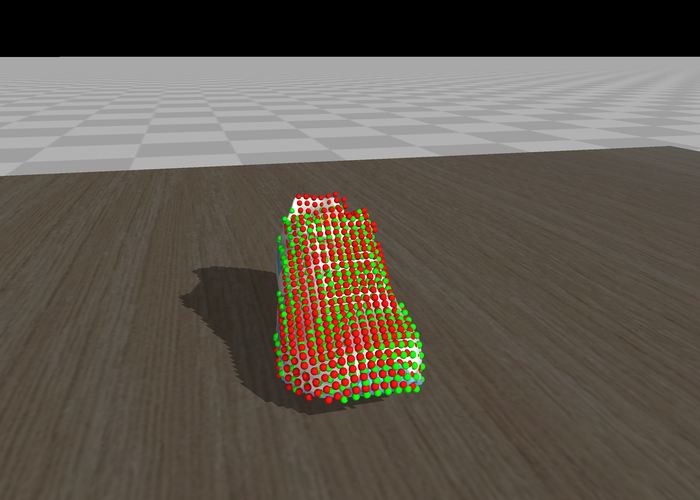

In [11]:
source = pcd_array2
target = pcd_array1

error, Tm = ICP(source,target,iteration = 10)
source = pcd_transform(source,Tm)
print(error)

env.reset()
env.init_viewer(
    azimuth           = 75,
    distance          = 0.5,
    elevation         = -18,
    lookat            = [0.64, 0.1, 0.83],
    transparent       = False,
    black_sky         = True,
)

env.set_p_base_body(body_name=obj_body_name,p=np.array([0.6,0,0.8]))
env.set_R_base_body(body_name=obj_body_name,R=np.eye(3,3))
env.forward(increase_tick=False)

while env.is_viewer_alive():
    env.step()

    for p in target: env.plot_sphere(p=p,r=0.002,rgba=[0.05,0.95,0.05,1])
    for p in source: env.plot_sphere(p=p,r=0.002,rgba=[0.95,0.05,0.05,1])
    env.render()

    image_backup, _ = env.grab_rgbd_img()
    if image_backup.sum() > 0: image = image_backup.copy()

env.close_viewer()

import mediapy
mediapy.show_image(image, width = 700)

### PnP Algorithm

In [12]:
import cv2

def detect_green_dots(image):
    """
    Detect green dots in an image and return their x,y coordinates.
    
    Parameters:
    image (numpy.ndarray): Input image as a NumPy array
    
    Returns:
    list: List of tuples containing (x,y) coordinates of detected green dots
    """
    # Convert to HSV color space for better color detection
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # Define green color range in HSV
    # Adjust these values based on your specific green shade
    lower_green = np.array([40, 50, 50])
    upper_green = np.array([80, 255, 255])
    
    # Create a mask for green pixels
    mask = cv2.inRange(hsv, lower_green, upper_green)
    
    # Find contours in the mask
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Store coordinates of detected dots
    dot_coordinates = []
    
    for contour in contours:
        # Calculate centroid of each contour
        M = cv2.moments(contour)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
            dot_coordinates.append((cx, cy))
    
    return dot_coordinates

In [26]:
env.reset()
env.init_viewer()

pcd_array = np.empty((0,3))
num_points = 30

env.set_p_base_body(body_name=obj_body_name,p=np.array([0.6,0,0.8]))
env.set_R_base_body(body_name=obj_body_name,R=np.eye(3,3))
env.forward(increase_tick=False)

while env.is_viewer_alive() and env.tick < 20:
    env.step()

    theta = np.radians(90)
    p_curr = p_center - radius* np.array((np.cos(theta),np.sin(theta),0))
    R_spin = rpy2r([0,0,theta])
    R_curr = np.dot(R_spin,R_start)
    env.data.cam('external').xpos = p_curr
    env.data.cam('external').xmat = np.reshape(R_curr,(9,))

    if env.loop_every(tick_every=10):
        rgb_ext,depth_ext,pcd_ext,T_cam_ext = env.get_fixed_cam_rgbd_pcd(
            cam_name='external',downscale_pcd=0.1)
        pcd_ext_above = pcd_ext[pcd_ext[:,2] > 0.8]
        pcd_array = np.vstack((pcd_array,pcd_ext_above))

env.close_viewer()
pcd_array = pcd_array[::10]
pcd_array = pcd_array[pcd_array[:,0] < 0.8][:num_points]

xyz_list = []
uv_list = []

for i in range(num_points):
    env.reset()
    tick = 0

    env.init_viewer(
        azimuth           = 28.8,
        distance          = 0.45,
        elevation         = -45,
        lookat            = [0.7, 0.03, 0.72],
        transparent       = False,
        black_sky         = True,
    )

    env.set_p_base_body(body_name=obj_body_name,p=np.array([0.6,0,0.8]))
    env.set_R_base_body(body_name=obj_body_name,R=np.eye(3,3))
    env.forward(increase_tick=False)

    while env.is_viewer_alive() and tick < 2:
        env.plot_sphere(p=pcd_array[i],r=0.002,rgba=[0.05,0.95,0.05,1])
        env.render()
        
        image_backup, _ = env.grab_rgbd_img()
        if image_backup.sum() > 0: image_temp = image_backup.copy()
        tick += 1

    env.close_viewer()
    uv = detect_green_dots(image_temp)
    if uv != []:
        xyz_list.append(pcd_array[i])
        uv_list.append(uv)

""

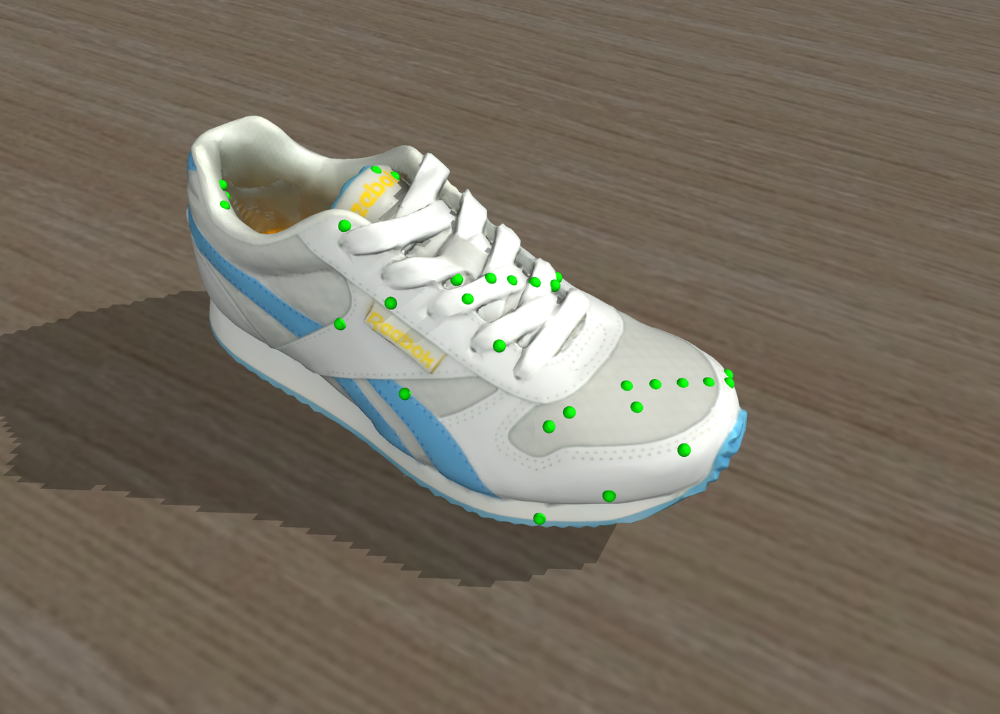

(29, 3)


In [27]:
env.init_viewer(
    azimuth           = 28.8,
    distance          = 0.45,
    elevation         = -45,
    lookat            = [0.7, 0.03, 0.72],
    transparent       = False,
    black_sky         = True,
)

env.set_p_base_body(body_name=obj_body_name,p=np.array([0.6,0,0.8]))
env.set_R_base_body(body_name=obj_body_name,R=np.eye(3,3))
env.forward(increase_tick=False)
xyz_array = np.array(xyz_list)

while env.is_viewer_alive():
    for i in range(xyz_array.shape[0]):
        env.plot_sphere(p=xyz_array[i],r=0.002,rgba=[0.05,0.95,0.05,1])
    env.plot_T(T=T_cam_ext,axis_len=0.1,axis_width=0.005,label='External')
    env.render()

    image_backup, _ = env.grab_rgbd_img()
    if image_backup.sum() > 0: image = image_backup.copy()

env.close_viewer()

import mediapy
mediapy.show_image(image, width = 1400)
print(xyz_array.shape)

""

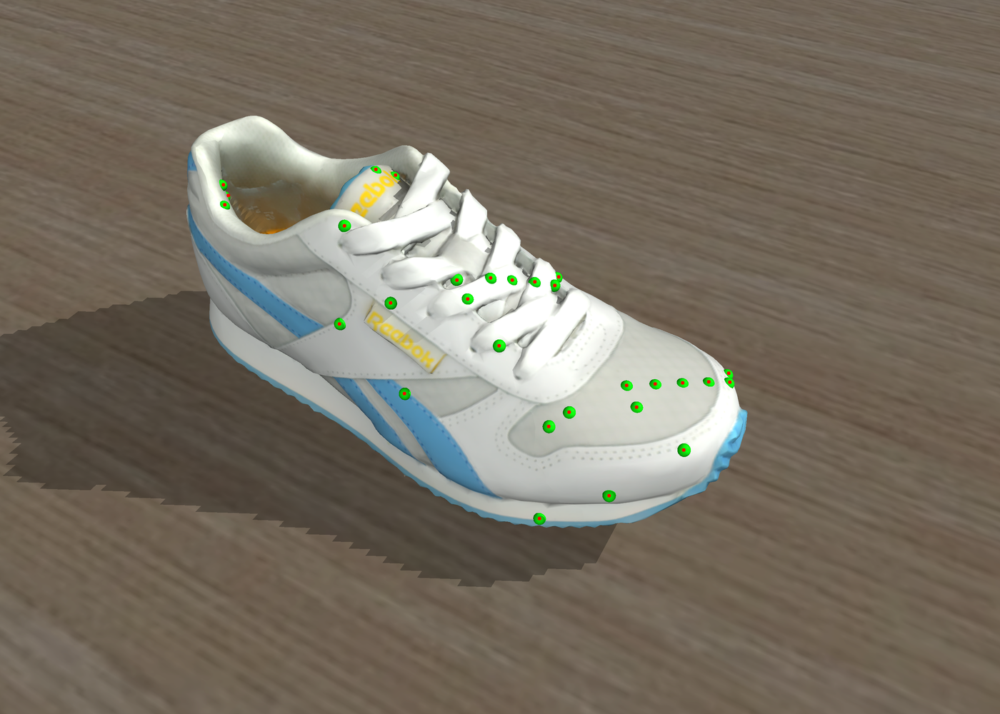

(29, 2)


In [28]:
def visualize_dots(image, coordinates, radius):
    """
    Draw circles around detected dots for visualization
    """
    image_copy = image.copy()
    for (u, v) in coordinates:
        cv2.circle(image_copy, (int(u), int(v)), radius, (255, 0, 0), -1)
    return image_copy

uv_array = np.array(uv_list).squeeze()
marked_image = visualize_dots(image, uv_array, radius=5)

import mediapy
mediapy.show_image(marked_image, width = 1400)
print(uv_array.shape)

In [29]:
points_3d = xyz_array.astype(np.float32)
points_2d = uv_array.astype(np.float32)

cam_fov = env.model.vis.global_.fovy
img_height, img_width = image.shape[:2]
focal_scaling = 0.5*img_height/np.tan(cam_fov*np.pi/360)

camera_matrix = np.array(((focal_scaling,0,img_width/2),
                          (0,focal_scaling,img_height/2),
                          (0,0,1)))

dist_coeffs = np.zeros((4,1))

success, rotation_vector, translation_vector = cv2.solvePnP(
    points_3d,
    points_2d,
    camera_matrix,
    dist_coeffs,
    flags=cv2.SOLVEPNP_ITERATIVE
)

print(success)
print("Rotation vector:", rotation_vector)
print("Translation vector:", translation_vector)

True
Rotation vector: [[ 2.09]
 [-1.23]
 [ 0.48]]
Translation vector: [[-0.3 ]
 [ 0.95]
 [ 0.53]]


projected_points: [[1512.19 1449.35]
 [1705.05 1386.53]
 [1134.91 1099.8 ]
 [1536.6  1193.31]
 [ 954.06  904.18]
 [1593.39 1154.37]
 [1093.63  846.27]
 [1914.76 1259.85]
 [1396.66  966.11]
 [ 963.27  631.17]
 [1782.13 1141.22]
 [1306.95  836.61]
 [ 631.91  575.54]
 [1754.41 1081.27]
 [1277.74  779.6 ]
 [ 624.98  516.33]
 [1835.31 1077.61]
 [1371.8   777.8 ]
 [ 636.    547.11]
 [1912.18 1074.49]
 [1431.16  784.53]
 [1985.63 1071.79]
 [1497.37  788.85]
 [1050.93  477.6 ]
 [2042.42 1072.15]
 [1553.45  795.16]
 [1103.32  492.53]
 [2039.81 1047.66]
 [1560.43  773.18]] 

actual_points: [[1510. 1452.]
 [1705. 1388.]
 [1132. 1102.]
 [1536. 1194.]
 [ 950.  907.]
 [1593. 1154.]
 [1093.  848.]
 [1914. 1260.]
 [1397.  968.]
 [ 964.  632.]
 [1782. 1140.]
 [1309.  837.]
 [ 629.  573.]
 [1754. 1079.]
 [1279.  784.]
 [ 625.  517.]
 [1834. 1075.]
 [1373.  778.]
 [ 639.  547.]
 [1911. 1072.]
 [1434.  784.]
 [1984. 1069.]
 [1497.  789.]
 [1052.  474.]
 [2043. 1070.]
 [1553.  799.]
 [1107.  490.]
 [2040. 

""

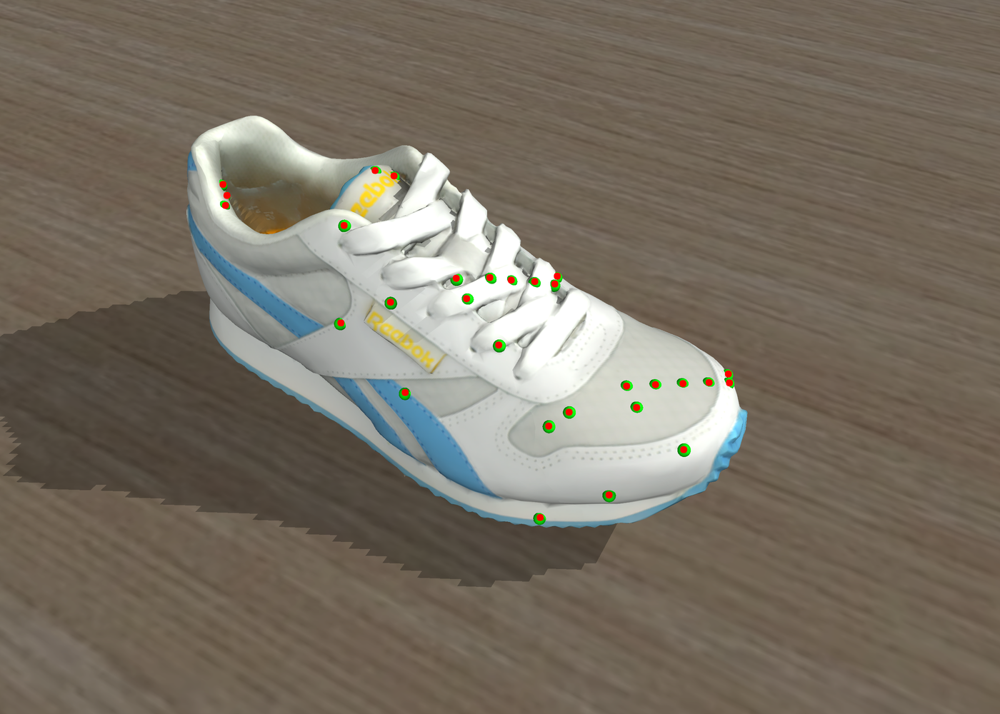

In [30]:
### Calculate reprojection error

projected_points, _ = cv2.projectPoints(
    points_3d,
    rotation_vector,
    translation_vector,
    camera_matrix,
    dist_coeffs
)

projected_points = projected_points.squeeze()
point_errors = np.sqrt(np.sum((points_2d - projected_points)**2, axis=1))
mean_error = np.mean(point_errors)

print("projected_points:", projected_points, "\n")
print("actual_points:", points_2d, "\n")
print("mean_error: ", mean_error)

result_image = visualize_dots(image, projected_points.astype(np.int64), radius=10)
mediapy.show_image(result_image, width = 1400)

### PnP Ransac

In [31]:
success, rvec, tvec, inliers = cv2.solvePnPRansac(
    points_3d,
    points_2d,
    camera_matrix,
    None,
    iterationsCount=1000,
    confidence=0.99,
    reprojectionError=12, 
    flags=cv2.SOLVEPNP_ITERATIVE
)
print("success: ", success)
print("rvec: ", rvec, "\n")
print("tvec: ", tvec)

success:  True
rvec:  [[ 2.09]
 [-1.23]
 [ 0.48]] 

tvec:  [[-0.3 ]
 [ 0.95]
 [ 0.53]]


projected_points: [[1512.19 1449.35]
 [1705.05 1386.53]
 [1134.91 1099.8 ]
 [1536.6  1193.31]
 [ 954.06  904.18]
 [1593.39 1154.37]
 [1093.63  846.27]
 [1914.76 1259.85]
 [1396.66  966.11]
 [ 963.27  631.17]
 [1782.13 1141.22]
 [1306.95  836.61]
 [ 631.91  575.54]
 [1754.41 1081.27]
 [1277.74  779.6 ]
 [ 624.98  516.33]
 [1835.31 1077.61]
 [1371.8   777.8 ]
 [ 636.    547.11]
 [1912.18 1074.49]
 [1431.16  784.53]
 [1985.63 1071.79]
 [1497.37  788.85]
 [1050.93  477.6 ]
 [2042.42 1072.15]
 [1553.45  795.16]
 [1103.32  492.53]
 [2039.81 1047.66]
 [1560.43  773.18]] 

actual_points: [[1510. 1452.]
 [1705. 1388.]
 [1132. 1102.]
 [1536. 1194.]
 [ 950.  907.]
 [1593. 1154.]
 [1093.  848.]
 [1914. 1260.]
 [1397.  968.]
 [ 964.  632.]
 [1782. 1140.]
 [1309.  837.]
 [ 629.  573.]
 [1754. 1079.]
 [1279.  784.]
 [ 625.  517.]
 [1834. 1075.]
 [1373.  778.]
 [ 639.  547.]
 [1911. 1072.]
 [1434.  784.]
 [1984. 1069.]
 [1497.  789.]
 [1052.  474.]
 [2043. 1070.]
 [1553.  799.]
 [1107.  490.]
 [2040. 

""

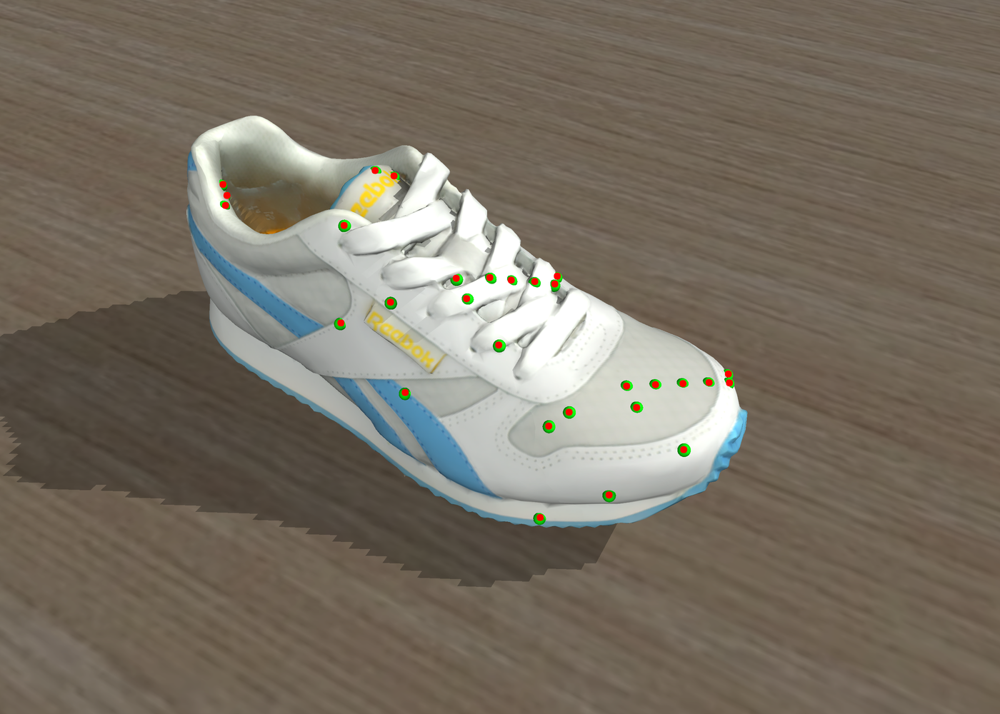

In [32]:
projected_points_ransac, _ = cv2.projectPoints(
    points_3d,
    rvec,
    tvec,
    camera_matrix,
    dist_coeffs
)

projected_points_ransac = projected_points_ransac.squeeze()
point_errors = np.sqrt(np.sum((points_2d - projected_points_ransac)**2, axis=1))
mean_error = np.mean(point_errors)

print("projected_points:", projected_points_ransac, "\n")
print("actual_points:", points_2d, "\n")
print("mean_error: ", mean_error)

result_ransac_image = visualize_dots(image, projected_points_ransac.astype(np.int64), radius=10)
mediapy.show_image(result_ransac_image, width = 1400)

## Feature Detection

""

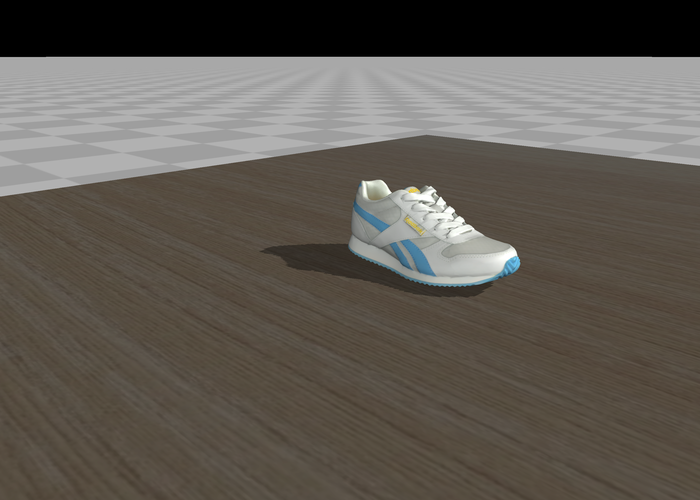

In [20]:
env.reset()
env.init_viewer(
    azimuth           = 45,
    distance          = 0.5,
    elevation         = -18,
    lookat            = [0.59, 0.1, 0.8],
    transparent       = False,
    black_sky         = True,
)

pcd_array1 = np.empty((0,3))

env.set_p_base_body(body_name=obj_body_name,p=np.array([0.6,0,0.8]))
env.set_R_base_body(body_name=obj_body_name,R=np.eye(3,3))
env.forward(increase_tick=False)

while env.is_viewer_alive() and env.tick < 100:
    env.step()
    env.render()

    image1_backup, _ = env.grab_rgbd_img()
    if image1_backup.sum() > 0: image1 = image1_backup.copy()

env.close_viewer()

import mediapy
mediapy.show_image(image1, width = 700)

""

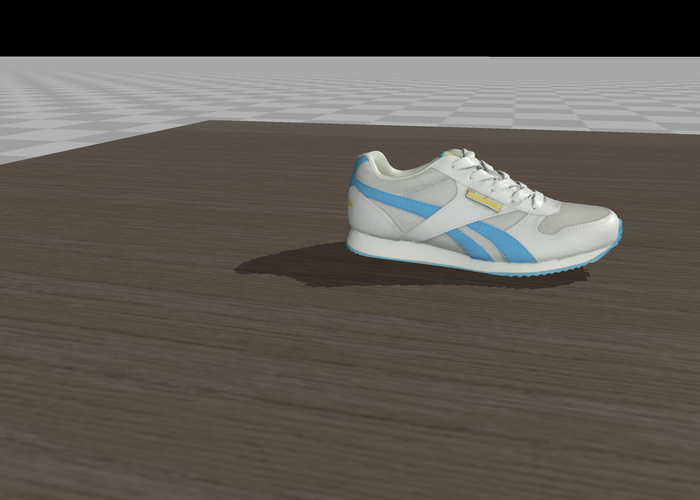

In [21]:
env.reset()
env.init_viewer(
    azimuth           = 15,
    distance          = 0.5,
    elevation         = -18,
    lookat            = [0.59, 0.1, 0.8],
    transparent       = False,
    black_sky         = True,
)

env.set_p_base_body(body_name=obj_body_name,p=np.array([0.6,0,0.8]))
env.set_R_base_body(body_name=obj_body_name,R=np.eye(3,3))
env.forward(increase_tick=False)

while env.is_viewer_alive() and env.tick < 100:
    env.step()
    env.render()

    image2_backup, _ = env.grab_rgbd_img()
    if image2_backup.sum() > 0: image2 = image2_backup.copy()

env.close_viewer()

import mediapy
mediapy.show_image(image2, width = 700)

### SIFT

[ WARN:0@39.009] global shadow_sift.hpp:15 SIFT_create DEPRECATED: cv.xfeatures2d.SIFT_create() is deprecated due SIFT tranfer to the main repository. https://github.com/opencv/opencv/issues/16736


""

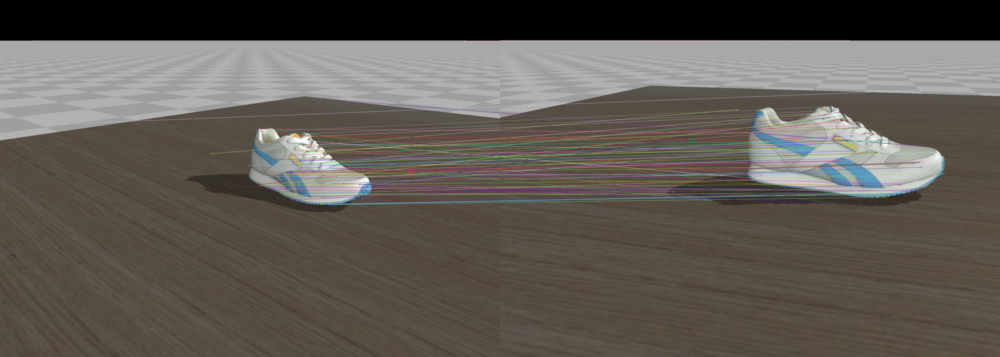

In [22]:
gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

detector = cv2.xfeatures2d.SIFT_create()

kp1, desc1 = detector.detectAndCompute(image1, None)
kp2, desc2 = detector.detectAndCompute(image2, None)

matcher = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = matcher.match(desc1, desc2)
matches = sorted(matches, key=lambda x: x.distance)
min_dist, max_dist = matches[-1].distance, matches[0].distance

ratio = 0.00001
boundary = (max_dist - min_dist) * ratio + min_dist
correct_matches = [m for m in matches if m.distance < boundary]

res = cv2.drawMatches(image1, kp1, image2, kp2, correct_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

mediapy.show_image(res, width = 2000)

### FAST + BRIEF

""

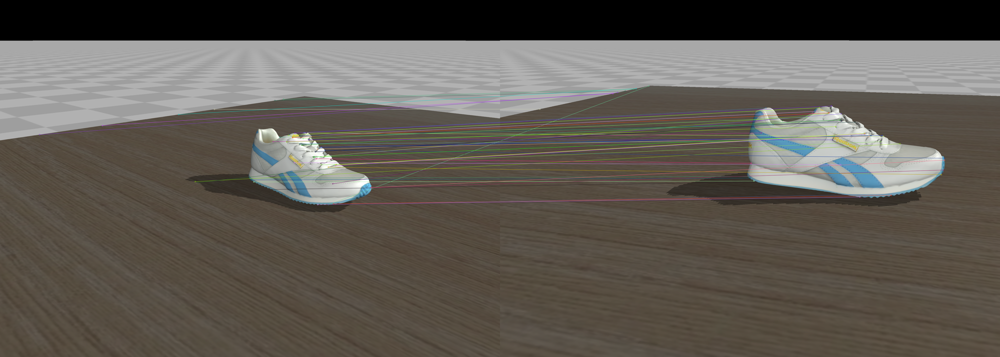

In [23]:
class FASTBRIEFDetector:
    def __init__(self, threshold=30, n_fast=500):
        """
        Initialize FAST and BRIEF detector
        
        Parameters:
        threshold: FAST detection threshold (default: 30)
        n_fast: Number of maximum features to retain (default: 500)
        """
        # Initialize FAST detector
        self.fast = cv2.FastFeatureDetector_create(
            threshold=threshold,  # Detection threshold value
            nonmaxSuppression=True  # Apply non-max suppression
        )
        self.n_fast = n_fast
        
        # Initialize BRIEF descriptor
        self.brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
    
    def detectAndCompute(self, image, mask=None):
        """
        Detect keypoints using FAST and compute BRIEF descriptors
        
        Parameters:
        image: Input image
        mask: Optional mask
        
        Returns:
        keypoints: Detected keypoints
        descriptors: Computed descriptors
        """
        # Convert image to grayscale if needed
        if len(image.shape) > 2:
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            gray = image.copy()
            
        # Detect keypoints using FAST
        keypoints = self.fast.detect(gray, mask)
        
        # Sort keypoints by response strength
        keypoints = sorted(keypoints, key=lambda x: x.response, reverse=True)
        
        # Keep only the strongest n_fast keypoints
        keypoints = keypoints[:self.n_fast]
        
        # Compute BRIEF descriptors
        keypoints, descriptors = self.brief.compute(gray, keypoints)
        
        return keypoints, descriptors

def match_features(img1, img2):
    """
    Match features between two images using FAST and BRIEF
    
    Parameters:
    img1, img2: Input images
    
    Returns:
    matches: List of matches
    img_matches: Image showing the matches
    """
    # Initialize detector
    detector = FASTBRIEFDetector()
    
    # Detect and compute
    kp1, des1 = detector.detectAndCompute(img1)
    kp2, des2 = detector.detectAndCompute(img2)
    
    # Initialize BFMatcher with Hamming distance
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    
    # Match descriptors
    matches = bf.match(des1, des2)
    
    # Sort matches by distance
    matches = sorted(matches, key=lambda x: x.distance)
    
    # Draw matches
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:50], None,
                                 flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    return matches, img_matches, kp1, kp2


# Basic matching
matches, result, kp1, kp2 = match_features(image1, image2)
mediapy.show_image(result, width=2000)

### ORB

""

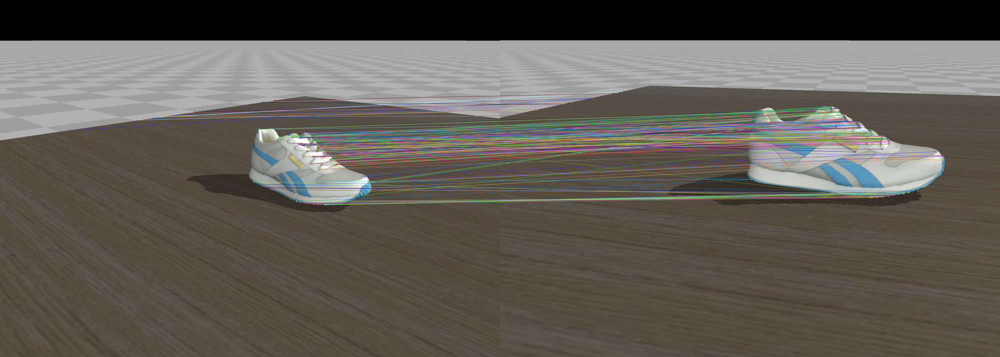

In [24]:
gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

detector = cv2.ORB_create(nfeatures=1000)

kp1, desc1 = detector.detectAndCompute(gray1, None)
kp2, desc2 = detector.detectAndCompute(gray2, None)

matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

matches = matcher.match(desc1, desc2)
matches = sorted(matches, key=lambda x: x.distance)
min_dist, max_dist = matches[-1].distance, matches[0].distance

ratio = 0.00001 
boundary = (max_dist - min_dist) * ratio + min_dist
correct_matches = [m for m in matches if m.distance < boundary]

res = cv2.drawMatches(image1, kp1, image2, kp2, correct_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

mediapy.show_image(res, width=2000)